# Libraries Required

In [1]:
import cv2
import numpy as np

# Resizing the Image 

In [2]:
def ResizeWithAspectRatio(image, width=None, height=None, inter=cv2.INTER_AREA):
    dim = None
    (h, w) = image.shape[:2]

    if width is None and height is None:
        return image
    if width is None:
        r = height / float(h)
        dim = (int(w * r), height)
    else:
        r = width / float(w)
        dim = (width, int(h * r))

    return cv2.resize(image, dim, interpolation=inter)

# Loading Image

In [3]:
cap=cv2.imread("11.jpeg")
cap = ResizeWithAspectRatio(cap, width=600)
frame=cap

# HSV Range to remove the Gums

In [4]:
hsv = cv2.cvtColor(frame, cv2.COLOR_BGR2HSV)
mask1 = cv2.inRange(hsv,(0, 20, 20), (15, 255, 255) )
cv2.imshow("m2", frame);
cv2.imshow("m1", mask1);
cv2.waitKey(0)
cv2.destroyAllWindows()

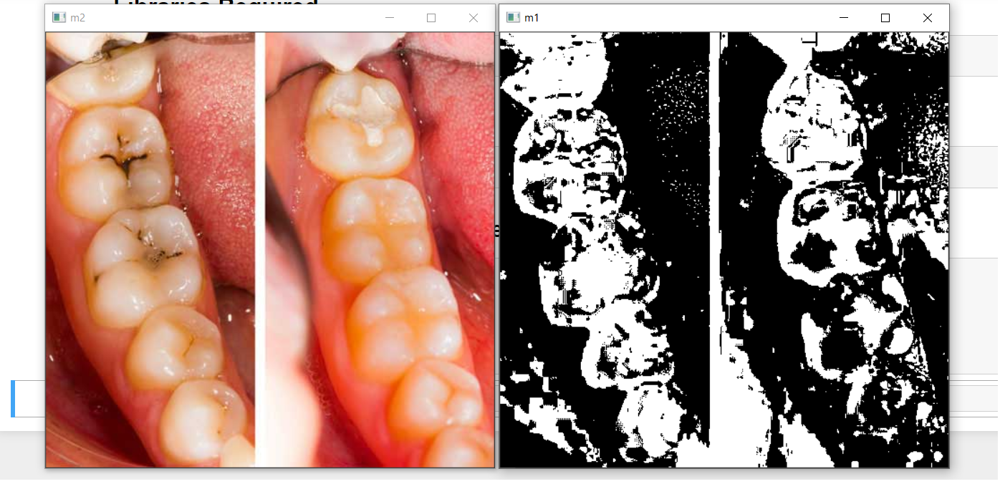

# Code to fill the mask and smoothing the area covered

In [5]:
img1=cv2.bitwise_and(frame,frame,mask=mask1)
hsv = cv2.cvtColor(img1, cv2.COLOR_BGR2HSV)
mask2=cv2.inRange(hsv,(9, 20, 20), (35, 255, 255) )

des = mask2.copy()
#des= cv2.bitwise_not(des)
contour,hier = cv2.findContours(des,cv2.RETR_CCOMP,cv2.CHAIN_APPROX_SIMPLE)

for cnt in contour:
    cv2.drawContours(des,[cnt],0,255,-1)
cv2.imshow("m3", des);
mask2=des
cv2.waitKey(0)
cv2.destroyAllWindows()

#Beard Removel

pixels = cv2.countNonZero(mask1) # OR
image_area = frame.shape[0] * frame.shape[1]
area_ratio = (pixels / image_area) * 100
print(area_ratio)
if(area_ratio<80):
    des = mask2.copy()
    #des= cv2.bitwise_not(des)
    contour,hier = cv2.findContours(des,cv2.RETR_CCOMP,cv2.CHAIN_APPROX_SIMPLE)

    for cnt in contour:
        cv2.drawContours(des,[cnt],0,255,-1)
    
    cv2.imshow("m3", des);
    mask1=des
    cv2.waitKey(0)
    cv2.destroyAllWindows()


45.9025


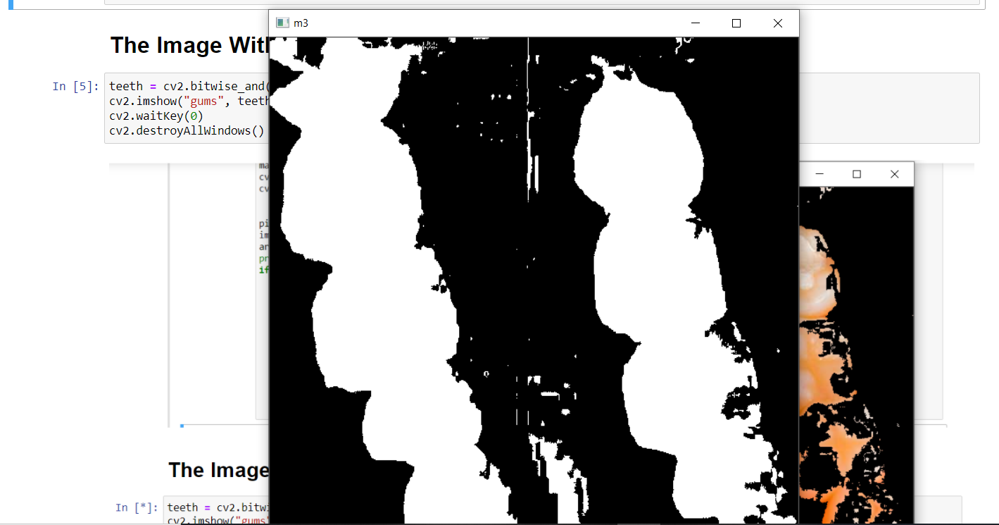

# The Image Without Gums

In [6]:
teeth = cv2.bitwise_and(frame,frame, mask=mask2)
cv2.imshow("gums", teeth);
cv2.waitKey(0)
cv2.destroyAllWindows()

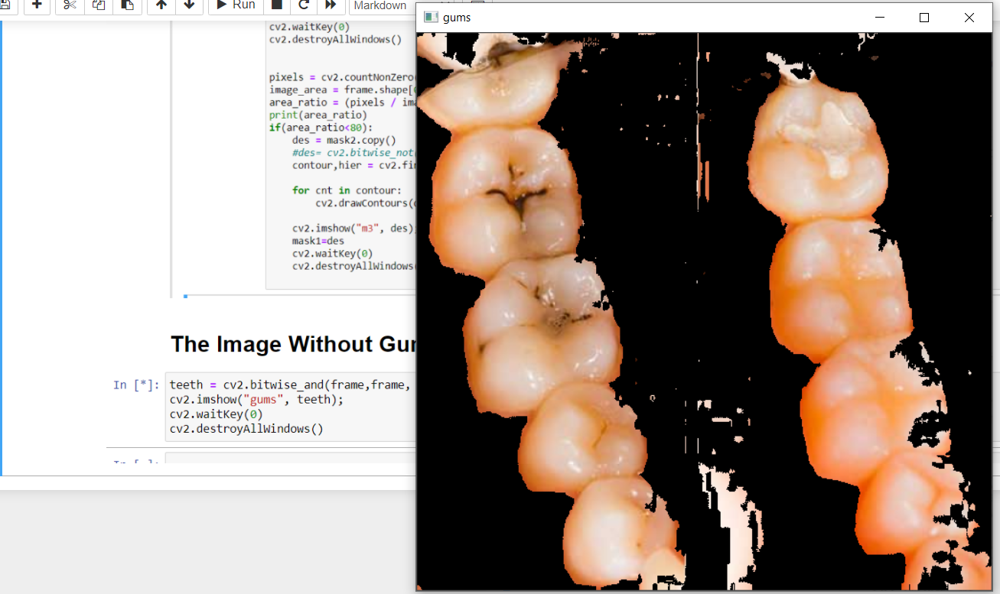

# Drawing Contours around teeth

In [7]:
image=teeth.copy()

cv2.imshow('Original',teeth)
edges = cv2.Canny(image,100,150)
cv2.imshow('Edges',edges)

# Exit Condition wait 5 msec and Esc is pressed
cv2.waitKey(0)
cv2.destroyAllWindows()


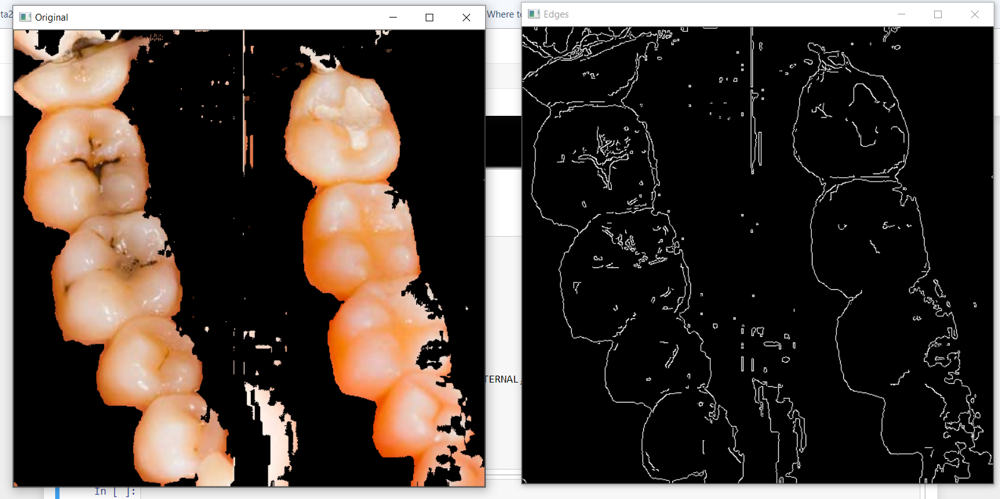

# Contour Green Color

In [8]:
contours, hierarchy= cv2.findContours(edges, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
cv2.drawContours(image, contours, -1, (0,255,0),1)
cv2.imshow('Original',teeth)
cv2.imshow('External Contours', image) 
cv2.waitKey(0)
cv2.destroyAllWindows()
img1=cap.copy()

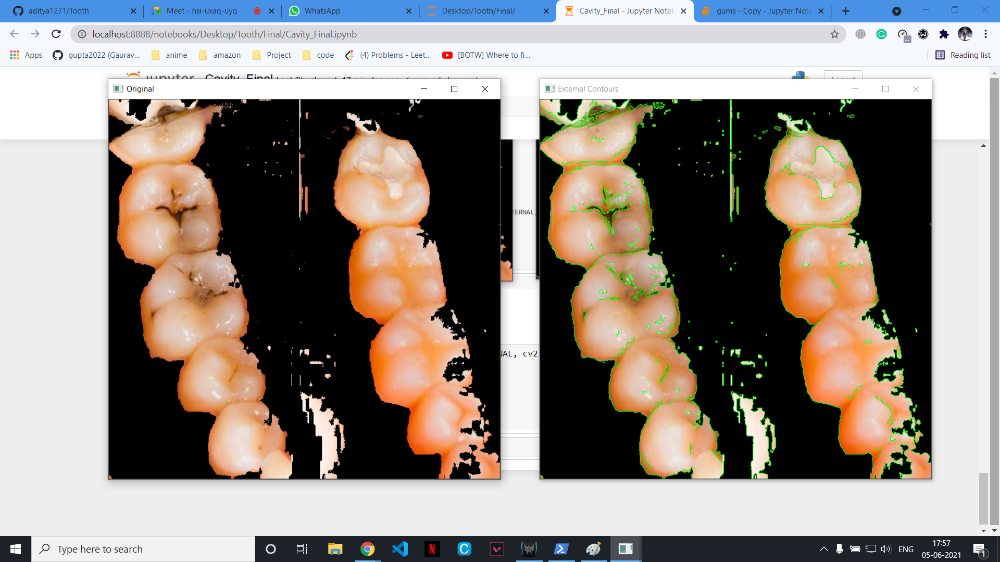

# Isolating the teeths

In [9]:
for i in range(0,img1.shape[0]):
    for j in range(0,img1.shape[1]):
        if(image[i,j,0]==0 and image[i,j,1]==0 and image[i,j,2]==0 ):
            img1[i,j]=(0,255,0)
        else:
            break
    for j in range(img1.shape[1]-1,0,-1):
        if(image[i,j,0]==0 and image[i,j,1]==0 and image[i,j,2]==0 ):
            img1[i,j]=(0,255,0)
        else:
            break;
cv2.imshow('External Contours', image) 
cv2.imshow('External Contours1', img1) 
cv2.waitKey(0)
cv2.destroyAllWindows()

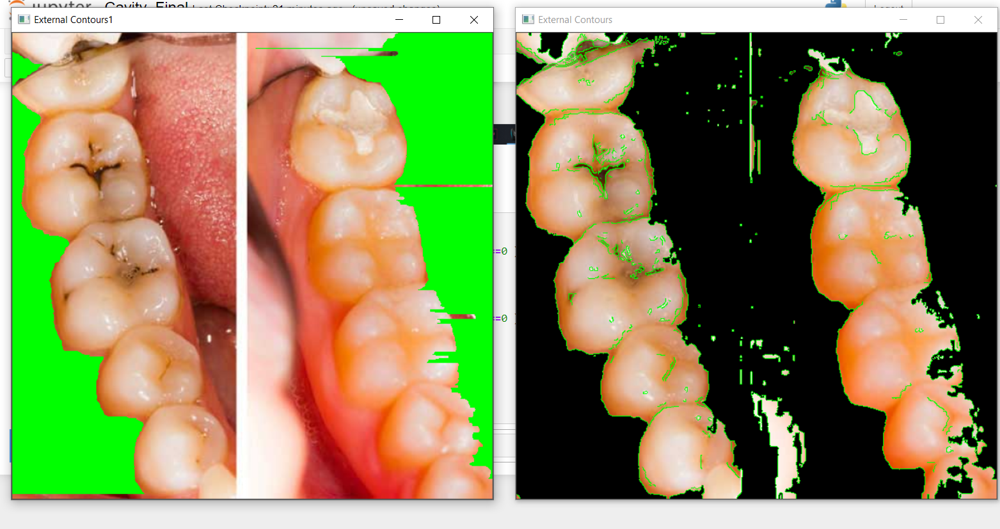

# Teeth Detection

In [10]:
hsv = cv2.cvtColor(img1, cv2.COLOR_BGR2HSV)
mask1 = cv2.inRange(img1,(0, 255, 0), (0, 255, 0) )
mask1=cv2.bitwise_not(mask1)
mask2=cv2.inRange(hsv,(9, 20, 20), (35, 255, 255) )


des = mask2.copy()
#des= cv2.bitwise_not(des)
contour,hier = cv2.findContours(des,cv2.RETR_CCOMP,cv2.CHAIN_APPROX_SIMPLE)

for cnt in contour:
    cv2.drawContours(des,[cnt],0,255,-1)
cv2.imshow("m3", des);
mask2=des
cv2.waitKey(0)
cv2.destroyAllWindows()

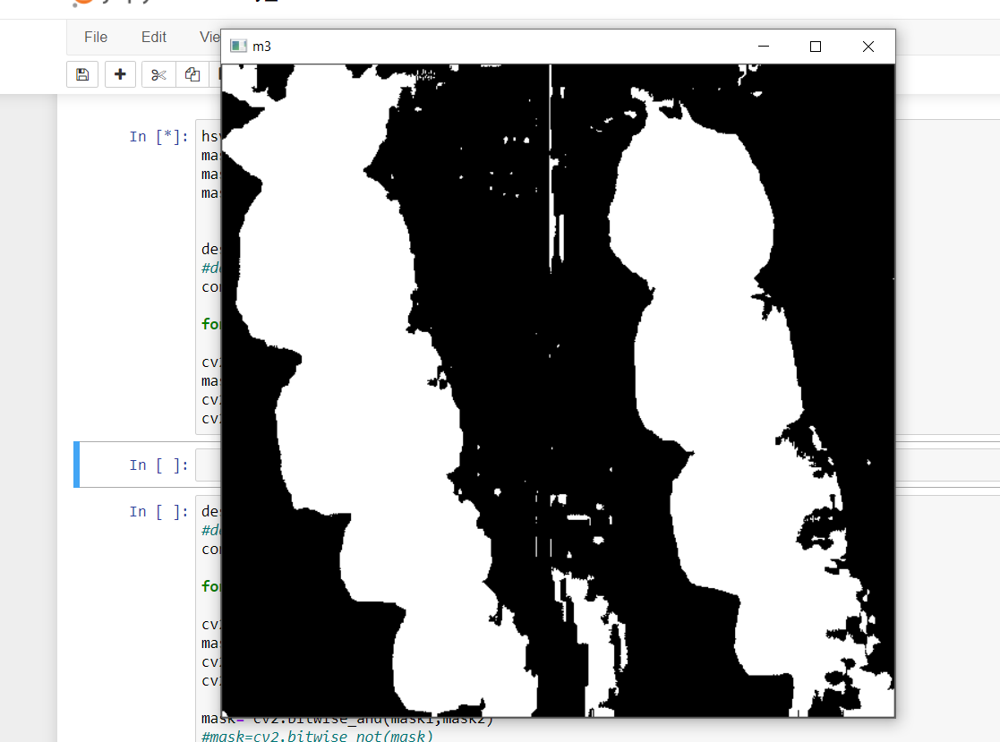

# Display teeths Only

In [11]:
des = mask2.copy()
#des= cv2.bitwise_not(des)
contour,hier = cv2.findContours(des,cv2.RETR_CCOMP,cv2.CHAIN_APPROX_SIMPLE)

for cnt in contour:
    cv2.drawContours(des,[cnt],0,255,-1)
#cv2.imshow("m3", des);
mask2=des
#cv2.waitKey(0)
#cv2.destroyAllWindows()

mask= cv2.bitwise_and(mask1,mask2)
#mask=cv2.bitwise_not(mask)
res=cv2.bitwise_and(img1,img1,mask=mask)
res[np.where((res==[0,0,0]).all(axis=2))] = [0,255,0]
cv2.imshow("m2", frame);
#cv2.imshow("m1", mask);
cv2.imshow("m3", res);

cv2.waitKey(0)
cv2.destroyAllWindows()

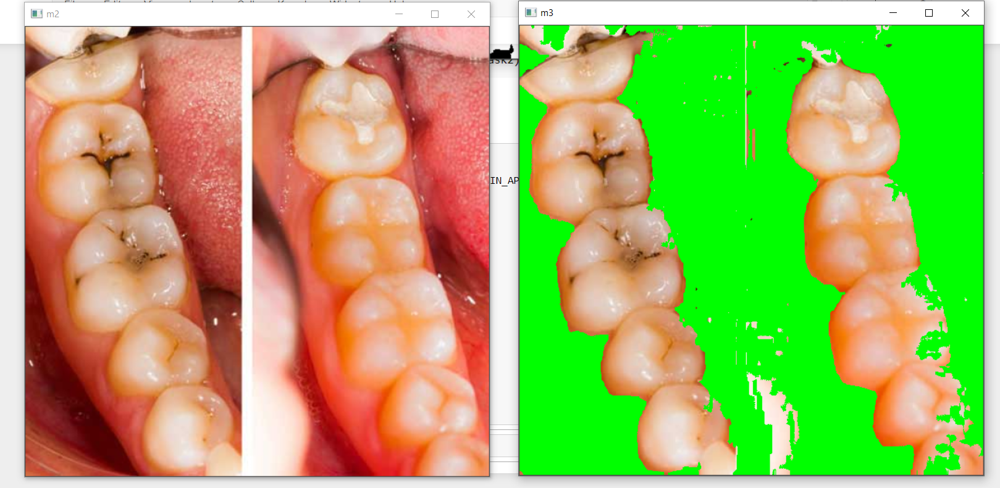

# Cavity Mask Creation

In [12]:
rgb = cv2.cvtColor(res.copy(), cv2.COLOR_BGR2HSV)
mask = cv2.inRange(rgb, (9, 117, 50),(18,255,114) )
cavity = cv2.bitwise_and(frame,frame, mask=mask)
#cv2.imshow('Green',res)
cv2.imshow('mask',mask)
#cv2.imshow('cavity',cavity)
cv2.imshow('orig',frame)
cv2.waitKey(0)
cv2.destroyAllWindows()


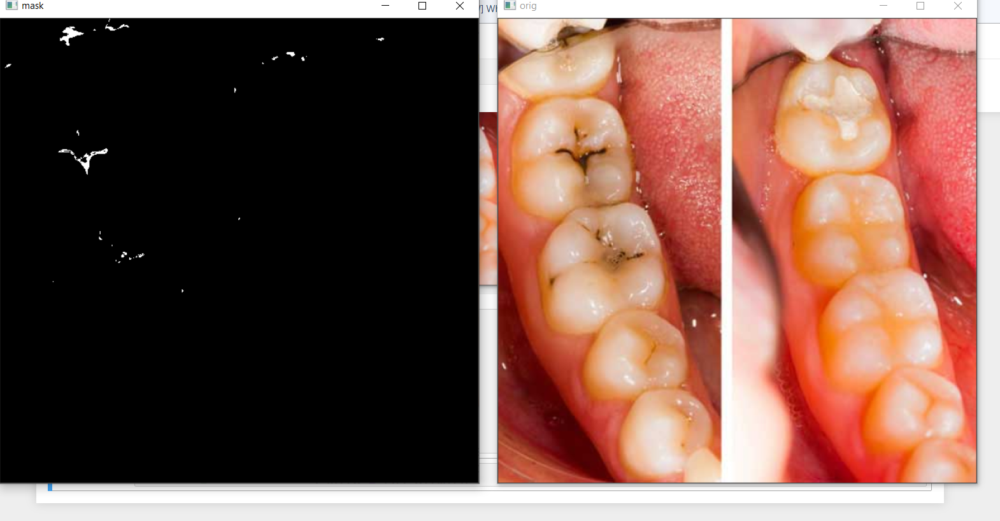

# To Calculate percentage

In [13]:
def percentage(x,w,y,h,img):
    count=0;
    for i in range(x,x+w):
        for j in range(y,y+h):
            #print(img[i,j])
            if(img[j,i]==255 ):
                count+=1;
    #print(count)
    return (count*100)/(w*h)

# Rectangle creation over cavity via the genrated mask

In [14]:
kernel = np.ones((20,20), np.uint8)
img = cv2.dilate(mask, kernel, iterations=1)
output_img=frame.copy()
avg=0;
total=0;
contours,x= cv2.findContours(img.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
for c in contours:
    # get the bounding rect
    x, y, w, h = cv2.boundingRect(c)
    # draw a white rectangle to visualize the bounding rect
    cv2.rectangle(output_img, (x, y), (x + w, y + h), 255, 1)
    avg=avg+percentage(x,w,y,h,img)
    total=total+1
    
print("Percentage: ", avg/total)
cv2.imshow('output',output_img)
cv2.waitKey(0)
cv2.destroyAllWindows()


Percentage:  83.88378001853376


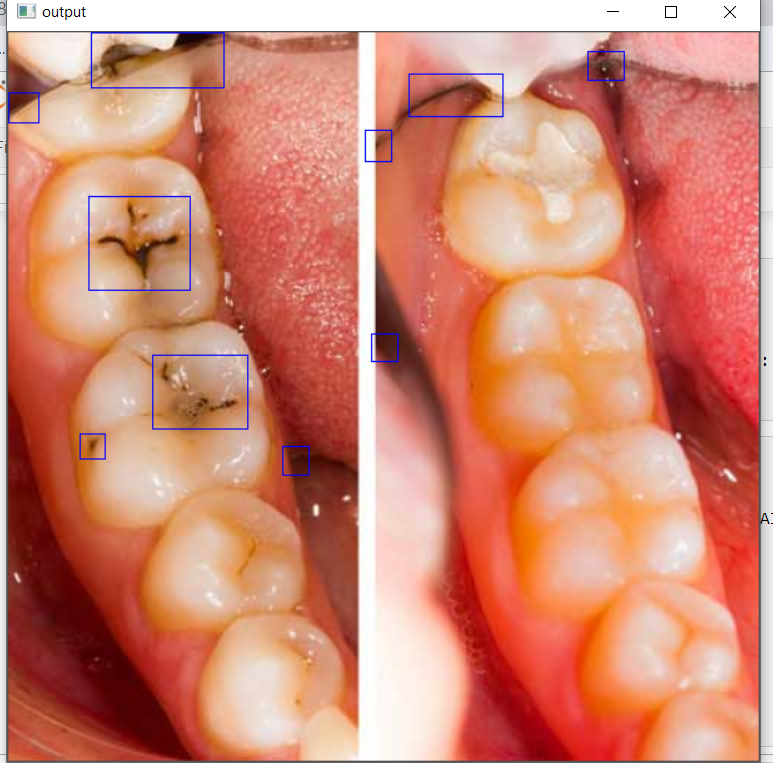